# Data Collection For Analysis

In [1]:
# import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import folium
from folium.plugins import HeatMap
import seaborn as sns
import pylab as pl
import calendar
import os

In [2]:
# store all required data files in 'files'
files = os.listdir('data_set')[-7:]
# display all files in 'files'
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [3]:
# remove the 'uber-raw-data-janjune-15.csv' file from the data
files.remove('uber-raw-data-janjune-15.csv')

In [4]:
# display all the remaining files
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [5]:
# initialize a variable to store the file path
path = r'data_set'

# create an empty data frame
final = pd.DataFrame()

# use a loop to concatenate all dataframes in 'files'
for file in files:
    # create a dataframe using the current file
    df = pd.read_csv(path+'/'+file, encoding='utf-8')
    # concatenate the current file's dataframe to the final dataframe
    final = pd.concat([df, final])


In [6]:
# find the dimensions of the final dataframe
final.shape

(4534327, 4)

# Data Prepration For Analysis

In [7]:
# create a copy of the final data frame
df = final.copy()

# call the head() method on df
df.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [8]:
# find the data types of the columns in the dataframe
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [9]:
# convert Date/Time from object type to a more readable format
df['Date/Time'] = pd.to_datetime(df['Date/Time'], format='%m/%d/%Y %H:%M:%S')

In [10]:
# find the data types of the columns in the dataframe again
df.dtypes 

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [11]:
# create additional columns in the data frame from existing columns
df['Month'] = df['Date/Time'].dt.month # column for the month
df['MonthName'] = df['Date/Time'].dt.month.apply(lambda x: calendar.month_name[x]) # column for the monthname
df['Day'] = df['Date/Time'].dt.day # column for the day number
df['Weekday'] = df['Date/Time'].dt.day_name() # column for the name of day
df['Hours'] = df['Date/Time'].dt.hour # column for the hours
df['Minutes'] = df['Date/Time'].dt.minute # column for the minutes

In [12]:
df.head()

,Date/Time,Lat,Lon,Base,Month,MonthName,Day,Weekday,Hours,Minutes
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,9,September,1,Monday,0,1
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,9,September,1,Monday,0,1
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,9,September,1,Monday,0,3
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,9,September,1,Monday,0,6
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,9,September,1,Monday,0,11


# Analysing Uber Trips Rush By Week Days

In [13]:
# creating a color palette
myPalette = ['#ff6692', '#19d3f3', '#ffa15a', '#ab63fa', '#00cc96', '#636efa', '#ef553b']

In [14]:
# find the indices and count of uber trips on weekdays
indices = df['Weekday'].value_counts().index
tripCounts = df['Weekday'].value_counts()

# create a new dataframe using the index and trip count as columns
dfNew = pd.DataFrame()
dfNew['Days'] = df['Weekday'].value_counts().index
dfNew['Trip Count'] = df['Weekday'].value_counts().values

# create a bar plot using plotly.express
px.bar(dfNew, x = 'Days', y = 'Trip Count', title = 'Uber Rides Booked vs Weekdays',color = 'Days')

From the bar plot above, it can be concluded that the highest number of Uber rides are booked  on **Thursdays**, followed by Fridays and Wednesdays.

The rush is lowest on **Sunday**

# Analysing Uber Trips Rush By Hour

We are analysing the the number of uber rides booked every hour of the day for all days of each month.
For this, we first find the number of unique months in the data-set

In [15]:
df['MonthName'].unique().size # compute the number of unique months in the data-set

6

We have the data for 6 unique months. So, we can create 3x2 subplots to plot 3 rows of 2 plots each 

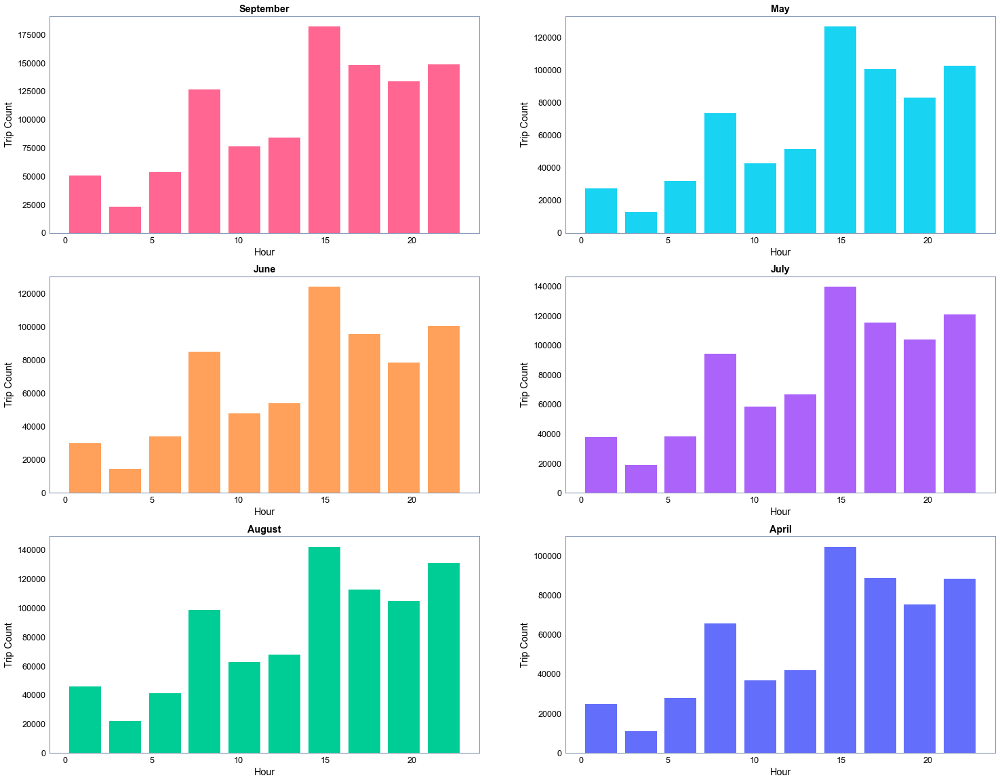

In [16]:
plt.figure(facecolor='white',figsize = (25,20))

mpl.rcParams.update({'text.color' : "black", 'axes.labelcolor' : "black", 'xtick.color': "black", 'ytick.color': "black",'axes.facecolor':"white"})

for i, month in enumerate(df['MonthName'].unique()):
    # create subplots
    plt.subplot(3,2, i+1)
    
    # plot a filtered dataframe
    df[df['MonthName'] == month]['Hours'].hist(color = myPalette[i], rwidth = 0.8)
    plt.title(month, fontweight='bold')
    plt.ylabel('Trip Count')
    plt.xlabel('Hour')
    plt.grid(False)

After careful observation of the histograms generated above, we can conclude that the rush for Uber rides is highest during the hours of **14:00 to 16:00**. So, the rush is highest during the noon from **2:00 P.M. to 4:00 P.M.**

# Analysing The Month With Highest Number Of Uber Rides

In [17]:
# We now group the data by Months
df.groupby('Month')['Hours'].count()

Month
4     564516
5     652435
6     663844
7     796121
8     829275
9    1028136
Name: Hours, dtype: int64

In [18]:
# create a trace object of the above grouped data using go

# CREATING A TRACE USING A PIE CHART
fig = go.Figure()
fig.add_trace(go.Pie(
        values = df.groupby('MonthName')['Hours'].count(),
        labels = df.groupby('MonthName')['Hours'].count().index,
        hole=.4,
        name = 'Priority'
    )
              
)
fig.update_traces(marker=dict(colors=myPalette))
fig.update_layout(title_text='Month vs Number Of Uber Rides')
fig.show()

The above plot clearly indicates that the highest number of cab bookings were made in the month of **September**, followed by the months of **August** and **July**.

# Analysis Of Journey Of Each Day

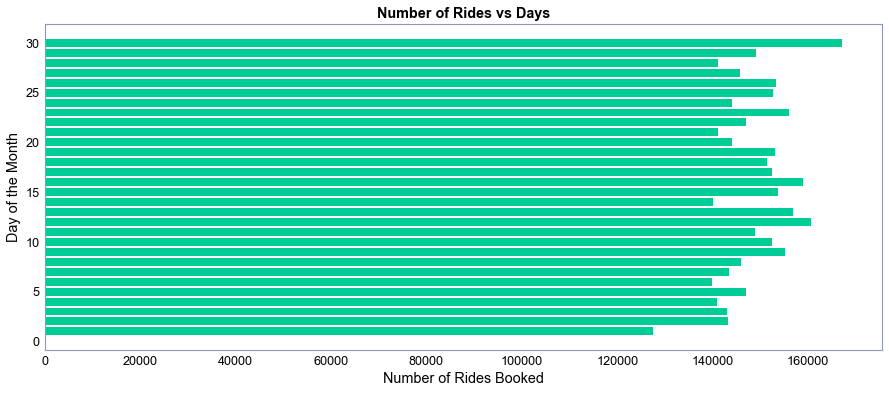

In [19]:
plt.figure(facecolor='white',figsize = (15,6))

# plot a horizontal histogram plot of the df['Day']
plt.hist(df['Day'], bins = 30, rwidth = 0.8, range =(0.5,30.5), orientation = 'horizontal', color = myPalette[4])
plt.title('Number of Rides vs Days', fontweight='bold')
plt.ylabel('Day of the Month')
plt.xlabel('Number of Rides Booked')
plt.grid(False)

The above histogram visualization ascertains that the highest number of rides were booked on the **30**th day of each month, followed by **12**th and **16**th day of the month.

The above visual can also be verified using the seaborn library as shown below.

Text(0, 0.5, 'Number of Rides Booked')

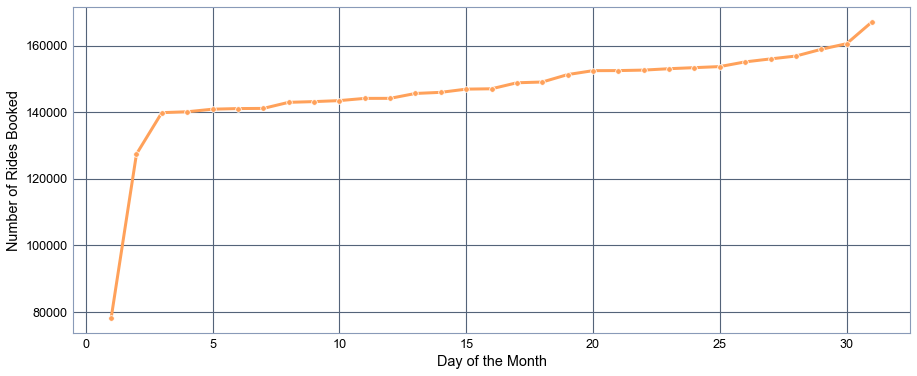

In [20]:
plt.figure(facecolor='white',figsize = (15,6))

# plot a line graph using seaborn
sns.lineplot(x = df['Day'].unique(), y = df['Day'].value_counts().iloc[::-1], marker = 'o', linewidth = 3, color = myPalette[2])
plt.xlabel('Day of the Month')
plt.ylabel('Number of Rides Booked')

From the line graph above, it can be verified that the last number of rides were booked on the **31st** of each month on average

# Analysis Of Month-Wise Total Rides 



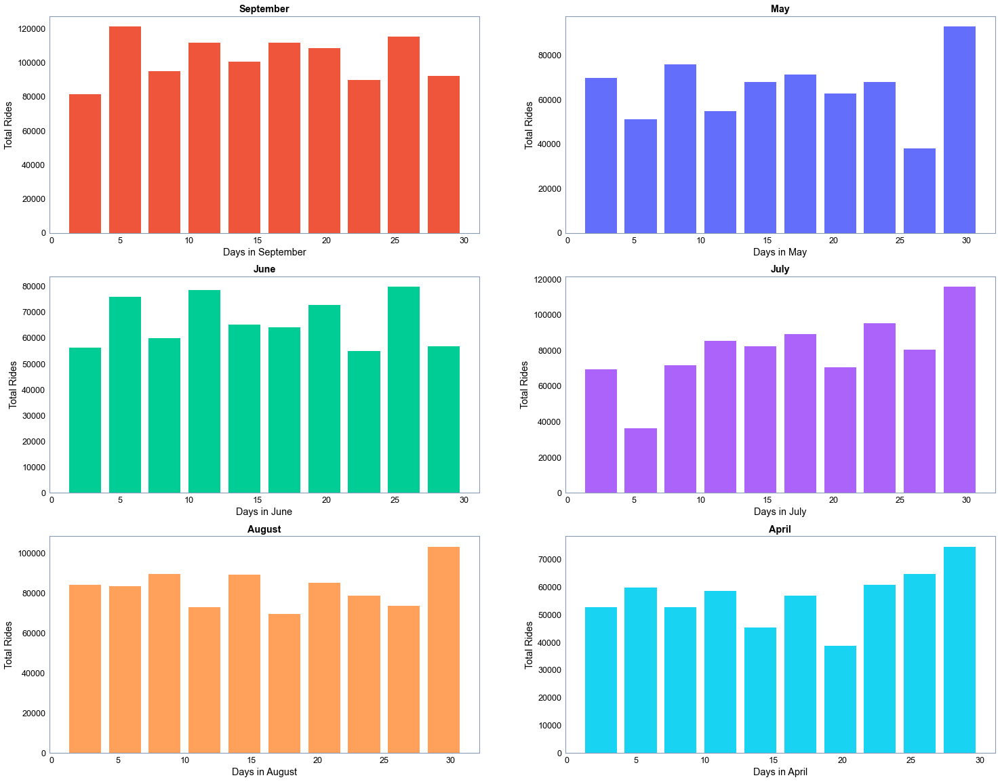

In [21]:
plt.figure(facecolor='white',figsize = (25,20))

# create 6 subplots, one for each month in the dataset
for i, month in enumerate(df['MonthName'].unique(),1):
    # create subplots
    plt.subplot(3,2,i)
    
    # plot a filtered dataframe
    dfNew = df[df['MonthName'] == month]
    plt.hist(dfNew['Day'], color = myPalette[7-i], rwidth = 0.8)
    plt.title(month, fontweight='bold')
    plt.xlabel(f'Days in {month}')
    plt.ylabel('Total Rides')
    plt.grid(False)

The histograms above, we can draw the following conclusions:
<ul>
    <li>In April, the highest number of rides were booked on <b>26th</b> and <b>29th</b> day of the month </li>
    <li>In May, the highest number of rides were booked on <b>9th</b> and <b>28th</b> day of the month </li>
    <li>In June, the highest number of rides were booked on <b>12th</b> and <b>26th</b> day of the month </li>
    <li>In July, the highest number of rides were booked on <b>23th</b> and <b>30th</b> day of the month </li>
    <li>In August, the highest number of rides were booked on <b>14th</b> and <b>30th</b> day of the month </li>
    <li>In September, the highest number of rides were booked on <b>5th</b> and <b>26th</b> day of the month </li>
</ul>

# Analysis Of Rush Every Hour 

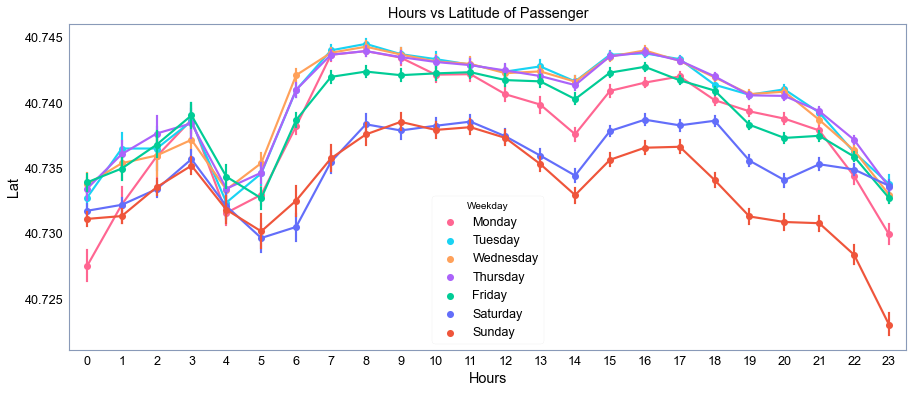

In [22]:
plt.figure(facecolor='white',figsize = (15,6))

# plot a pointplot using seaborn to analysze the rush every hours for all days
ax = sns.pointplot(x = 'Hours',y ='Lat', data = df, hue = 'Weekday', palette = myPalette)
ax.set_title('Hours vs Latitude of Passenger')
plt.grid(False)

The pointplot above suggests that the rush is high during the morning hours of 6:00 AM to 9:00 AM and the evening hours of 3:00 PM to 5:00 PM.

The rush gradually declines during the night time hours of 9:00 PM to 12:00 AM

# Which Base Number Gets Popular By Month?


In [23]:
# group the data by base number and month name
base = df.groupby(['Base','MonthName'])['Date/Time'].count().reset_index()
base.head()

,Base,MonthName,Date/Time
0,B02512,April,35536
1,B02512,August,31472
2,B02512,July,35021
3,B02512,June,32509
4,B02512,May,36765


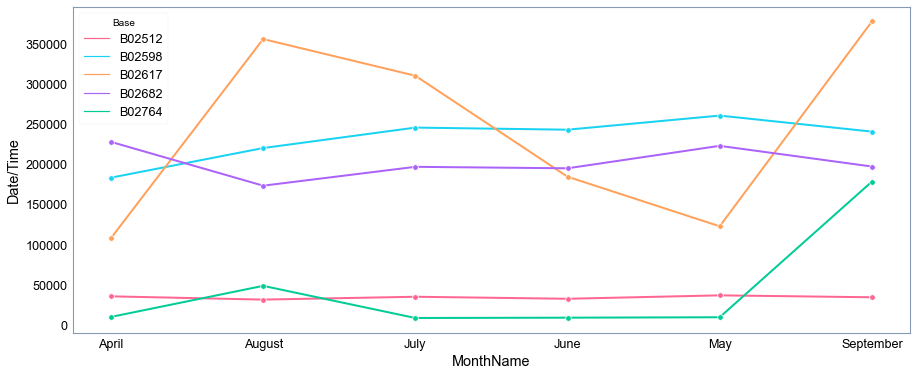

In [24]:
plt.figure(facecolor='white',figsize = (15,6))

# plot a lineplot using seaborn to analyze which base number gets popular by month
sns.lineplot(x = 'MonthName', y = 'Date/Time', hue = 'Base', data = base, palette = myPalette[0:5], linewidth = 2, marker = 'o')
plt.grid(False)

From the line plot generated above the following inferences can be drawn:
- The base number **B02764** shows promising popularity growth after the month of may
- The base number **B02682** shows a slight decline in the overall popularity growth
- The base number **B02617** shows significant growth from April to August. There is a continuous decline in popularity upto the month of May. From May to September, there is a staggering increment in the populariity growth
- The base number **B02598** shows gradual and somewhat slight increse in the popularity growth
- The base number **B02512** shows almost no popularity increase in the dataset months.

# Performing Cross Analysis

In [25]:
def count_rows(rows):
    return len(rows)

In [26]:
# create a function to get a heatmap grouped by col1 and col2
def heat_map(col1, col2):
    crossData  = df.groupby([col1, col2]).apply(count_rows)
    
    # create a pivot table from the grouped data
    pivotTable = crossData.unstack()
    
    # create a heatmap from pivotTable
    return sns.heatmap(pivotTable, cmap="YlGn", linewidths=.5)

## Cross Analysis by Hour And Weekday

<AxesSubplot:xlabel='Hours', ylabel='Weekday'>

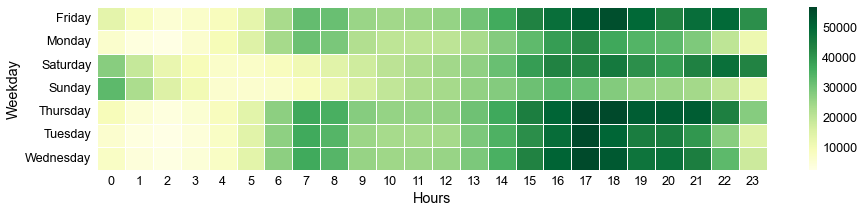

In [27]:
plt.figure(facecolor='white',figsize = (15,3))
heat_map('Weekday','Hours')

The heatmap above signifies the rush is high during the hours of 4:00 PM to 6:00 PM during most days.
The rush is lowest during the hours of 11:00 PM to 5:00 AM in the morning.

## Cross Analysis by Hour And Day

<AxesSubplot:xlabel='Day', ylabel='Hours'>

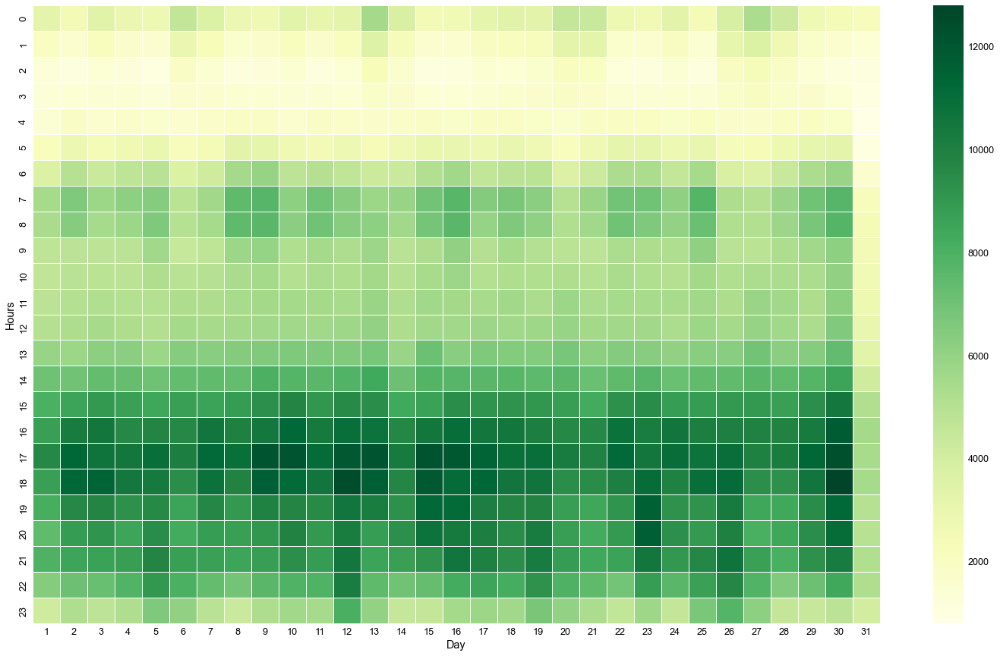

In [28]:
plt.figure(facecolor='white',figsize = (25,15))
heat_map('Hours','Day')

The heatmap above signifies the rush is high during the hours of 3:00 PM to 6:00 PM during most days.
The rush is lowest during the hours of 11:00 PM to 5:00 AM in the morning.

## Cross Analysis by Month And Day

<AxesSubplot:xlabel='Day', ylabel='MonthName'>

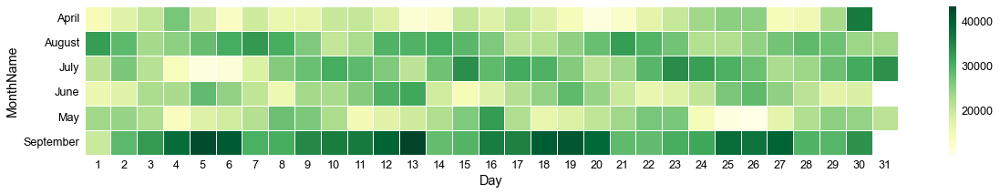

In [29]:
plt.figure(facecolor='white',figsize = (20,3))
heat_map('MonthName','Day')

From the heatmap above, it is clear that the most number of rides are booked during the month of September and lowest during the month of April

## Cross Analysis by Month And Weekday

<AxesSubplot:xlabel='Weekday', ylabel='MonthName'>

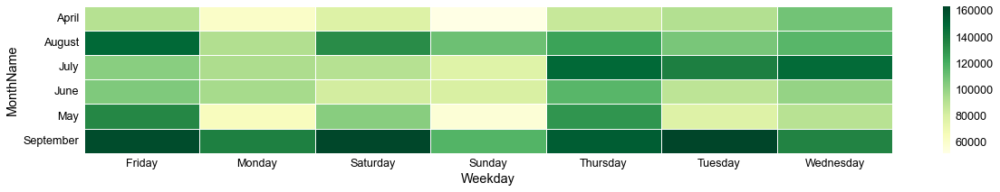

In [30]:
plt.figure(facecolor='white',figsize = (20,3))
heat_map('MonthName','Weekday')

The heatmap above shows that the rush is highest in September during Fridays, Saturdays and Tuesdays.
Also, the rush is lowest during Sundays of all months.

# Analysing Location Data Points

In [31]:
df.head()

,Date/Time,Lat,Lon,Base,Month,MonthName,Day,Weekday,Hours,Minutes
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,9,September,1,Monday,0,1
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,9,September,1,Monday,0,1
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,9,September,1,Monday,0,3
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,9,September,1,Monday,0,6
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,9,September,1,Monday,0,11


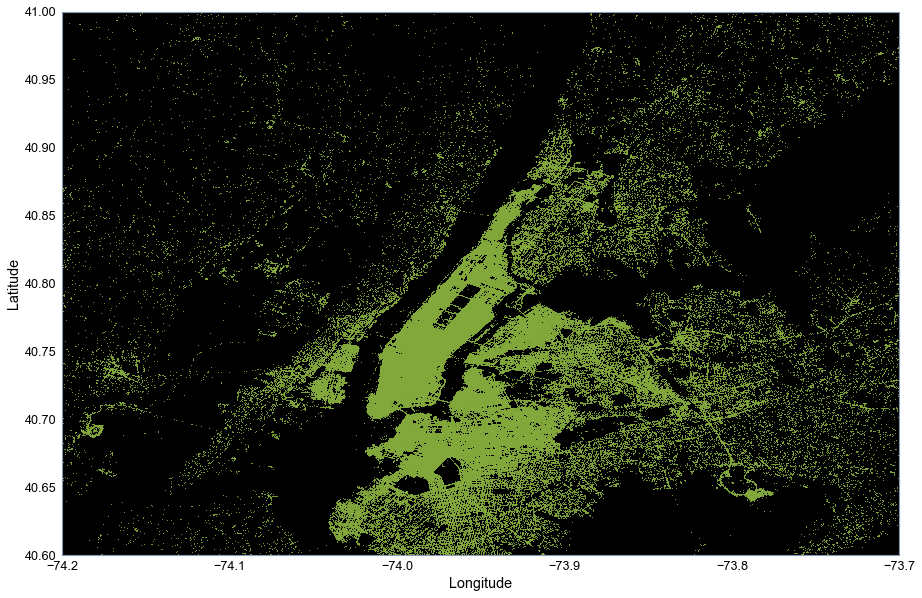

In [32]:
plt.figure(facecolor='white',figsize = (15,10))

# plot all data points on the map of New York
ax = plt.axes()
ax.set_facecolor('black')
plt.plot(df['Lon'], df['Lat'], 'go', ms = 0.9)

plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.xlim(-74.2, -73.7)
plt.ylim(40.6, 41)
plt.grid(False)

From the visual above, the highest number of rides are booked in the **Midtown Manhattan** to **Lower Manhattan**, followed by **Upper Manhattan** to **Brooklyn Heights** areas.

# Automated Spatial Analysis of Ride Rush

In [33]:
# define a function to create a spatial plot of ride rush in New York
def spatial_plot(df, day):
    df_spa = df[df['Weekday'] == day]
    df_rush = df_spa.groupby(['Lat','Lon'])['Weekday'].count().reset_index()
    
    basemap = folium.Map(location = [40.730610, -73.935242]) 
    HeatMap(df_rush, radius = 15).add_to(basemap)
    return basemap
    

In [34]:
spatial_plot(df,'Monday')

From the visual above, the highest number of rides are booked in the **Midtown Manhattan** to **Lower Manhattan**, followed by **Upper Manhattan** to **Brooklyn Heights** areas.

# Data Preparation for Uber Pickups in Each Month

In [35]:
filepath = r"data_set\uber-raw-data-janjune-15.csv"
# read the data for january to june
uber_jan_june = pd.read_csv(filepath)

In [36]:
uber_jan_june.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [37]:
uber_jan_june.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [38]:
# resolve the 'Pickup_date' column to a more readable format
uber_jan_june['Pickup_date'] = pd.to_datetime(uber_jan_june['Pickup_date'], format = '%Y-%m-%d %H:%M:%S')

In [39]:
# add additional columns to the data set
uber_jan_june['Month'] = uber_jan_june['Pickup_date'].dt.month
uber_jan_june['Weekday'] = uber_jan_june['Pickup_date'].dt.day_name()
uber_jan_june['Day'] = uber_jan_june['Pickup_date'].dt.day
uber_jan_june['Hours'] = uber_jan_june['Pickup_date'].dt.hour
uber_jan_june['Minutes'] = uber_jan_june['Pickup_date'].dt.minute

In [40]:
# column for the monthname
uber_jan_june['MonthName'] = uber_jan_june['Pickup_date'].dt.month.apply(lambda x: calendar.month_name[x]) 

In [41]:
uber_jan_june.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month,Weekday,Day,Hours,Minutes,MonthName
0,B02617,2015-05-17 09:47:00,B02617,141,5,Sunday,17,9,47,May
1,B02617,2015-05-17 09:47:00,B02617,65,5,Sunday,17,9,47,May
2,B02617,2015-05-17 09:47:00,B02617,100,5,Sunday,17,9,47,May
3,B02617,2015-05-17 09:47:00,B02774,80,5,Sunday,17,9,47,May
4,B02617,2015-05-17 09:47:00,B02617,90,5,Sunday,17,9,47,May


In [42]:
# create a new dataframe using the index and trip count as columns
df_jan_june = pd.DataFrame()
df_jan_june['Month'] = uber_jan_june['MonthName'].value_counts().index[::-1]
df_jan_june['Pickups'] = uber_jan_june['MonthName'].value_counts().values[::-1]

# create a bar plot using plotly
px.bar(df_jan_june, x = 'Month', y = 'Pickups', title = 'Uber Pickups Each Month', color = 'Month')


From the bar plot above, we can analyze that the highest number of pickups were made in the months of June and May, while the lowest number of pickups were made in the month of January

# Analysing Rush Per Hour in New York

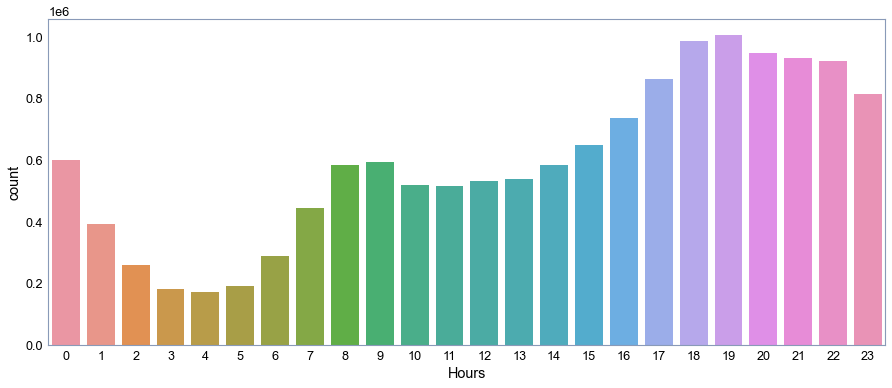

In [43]:
plt.figure(facecolor='white', figsize=(15,6))

# plot a countplot using seaborn to analyze the rush per hour in New York
sns.countplot(x = uber_jan_june['Hours'])
plt.grid(False)

The countplot above shows that the highest number of rides are booked during the hours of 5:00 PM to 10:00 PM

# Analysing Rush in New York City Day and Hour-Wise

In [44]:
# create a gist of data by grouping data by weekdays and Hours
gist = uber_jan_june.groupby(['Weekday','Hours'])['Pickup_date'].count().reset_index()
gist.columns = ['Weekday','Hours','Counts']
gist.head()

,Weekday,Hours,Counts
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


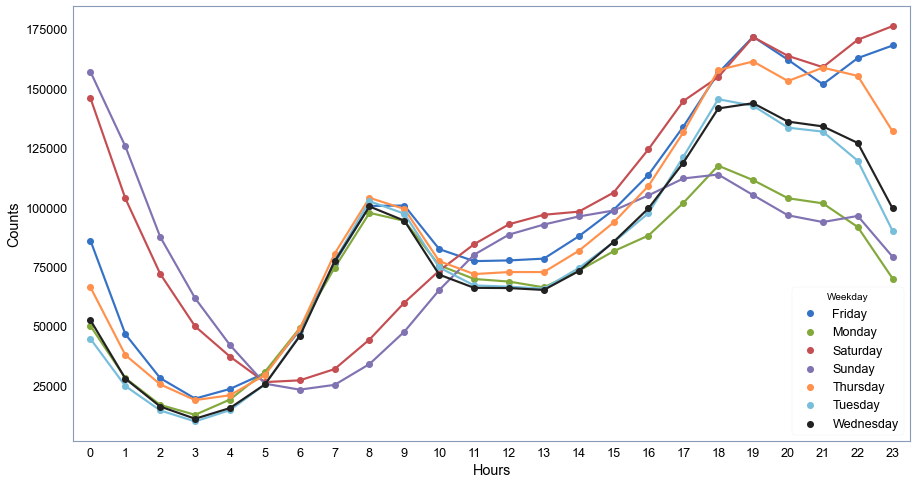

In [45]:
plt.figure(facecolor='white', figsize=(15,8))

# plot a pointplot using seaborn using hours on the x-axis and counts on the y-axis
sns.pointplot(x = 'Hours', y = 'Counts', hue = 'Weekday', data = gist)
plt.grid(False)

From the point plot above, we can draw the followig conclusions:
- The rush for all days show a steep decline from 12:00 AM to 4:00 AM.
- The rush for weekdays increases from 4:00 AM to 9:00 AM and from 2:00 PM to 7:00 PM.
- The rush for weekend increases from 7:00 AM to 6:00 PM in a gradual and non-uniform manner. 

# Which Base Number Has Most Active Vehicles?

In [46]:
df_foil = pd.read_csv(r'data_set/Uber-Jan-Feb-FOIL.csv')

In [47]:
df_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


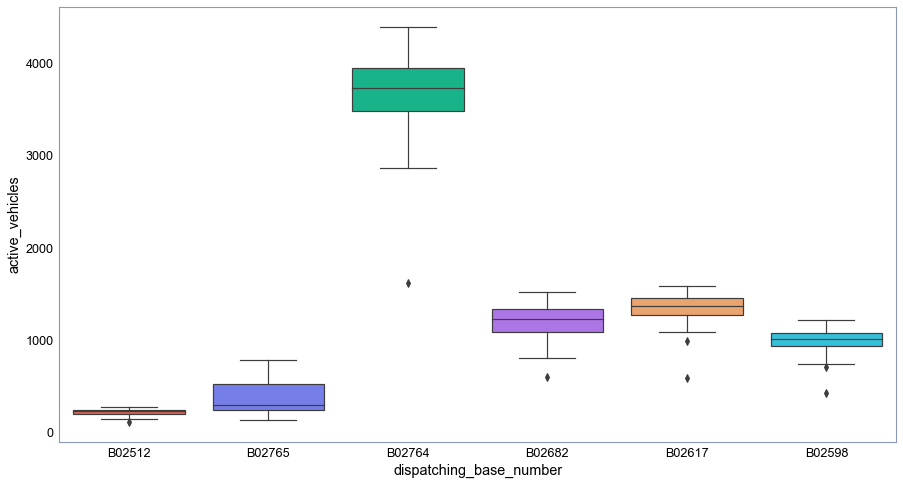

In [48]:
plt.figure(facecolor='white', figsize=(15,8))
sns.boxplot(x = 'dispatching_base_number', y = 'active_vehicles', data = df_foil, palette=myPalette[::-1])
plt.grid(False)

The box plot above shows that the most popular base number is **B02764**

# Which Base Number Has Most Trips?


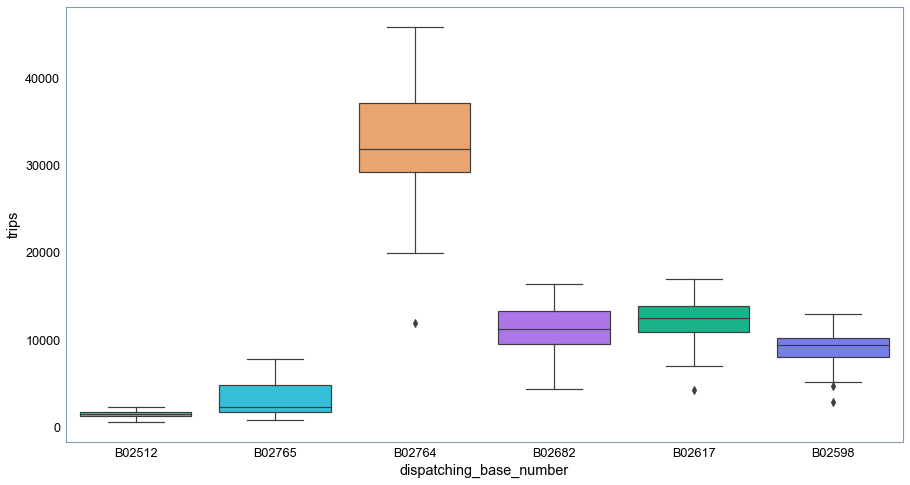

In [49]:
plt.figure(facecolor='white', figsize=(15,8))
sns.boxplot(x = 'dispatching_base_number', y = 'trips', data = df_foil, palette=myPalette)
plt.grid(False)

The box plot above shows that the base number with most number of trips is **B02764**

# How Trips Per Vehicle Increases/Decreases With Dates For Each Base Number?

In [50]:
df_foil['Trips/Vehicle'] = df_foil['trips']/df_foil['active_vehicles']

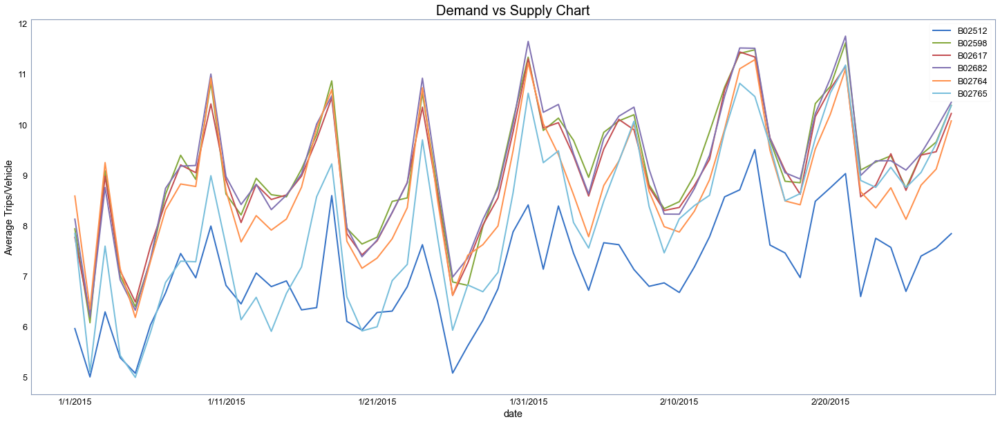

In [51]:
plt.figure(facecolor='white', figsize=(25,10))

# plot the foil data after grouping by 'dispatching_base_number'
df_foil.set_index('date').groupby(['dispatching_base_number'])['Trips/Vehicle'].plot(linewidth = 2)

plt.ylabel('Average Trips/Vehicle')
plt.title('Demand vs Supply Chart', fontsize = 20)
plt.legend()
plt.grid(False)

The above plot shows that there are a lot of irregularities in the average number of trips per vehicle from the 1/1/15 to 3/1/15. 
The base numbers B02512 and B02765 show a continuously and relatively lower average number of trips per vehicle